# Singular Value Decomposition (SVD)

## setup

In [1]:
import torch as t
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML
from PIL import Image
import torchvision.transforms as transforms

device = 'cuda' if t.cuda.is_available() else 'cpu'

## utils

In [889]:
def plot_points(data, v=None, enumerate=False, ax=None, xlim=[-3, 3], ylim=[-2, 2]):
    if ax is None: fig, ax = plt.subplots()
    else: fig = ax.get_figure()
    if xlim is not None: ax.set_xlim(xlim)
    if ylim is not None: ax.set_ylim(ylim)
    ax.set_xticklabels([])
    ax.set_yticklabels([])
    
    ax.set_aspect('equal', adjustable='box')
    ax.grid(True)
    fig.tight_layout()

    ax.plot(data[:, 0], data[:, 1], 'o', markersize=3)
    if v is not None:
        ax.annotate('', xy=(v[0, 0], v[1, 0]), xytext=(0, 0), arrowprops=dict(facecolor='black', linewidth=0, width=3, headwidth=8))
        ax.annotate('', xy=(v[0, 1], v[1, 1]), xytext=(0, 0), arrowprops=dict(facecolor='brown', linewidth=0, width=3, headwidth=8))

## PCA

In [890]:
def make_data(samples=1000):
    xs = t.randn(samples)
    ys = 0.5 * xs + 0.5 * t.randn(samples)
    data = t.stack([xs, ys], dim=1)
    data -= data.mean(dim=0)
    return data

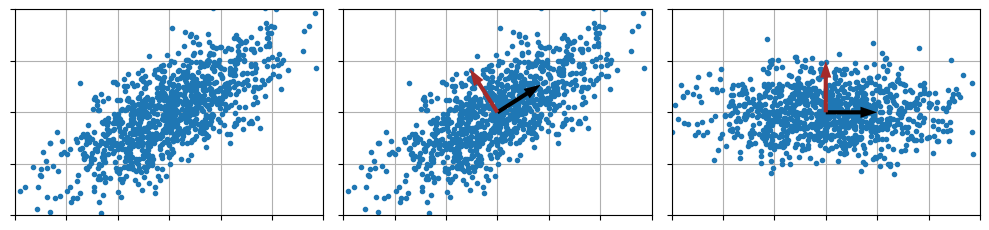

In [891]:
t.manual_seed(42)
data = make_data()
fig, ax = plt.subplots(1, 3, figsize=(10, 4))
plot_points(data, ax=ax[0])
u, s, v = t.svd(data)
# prevent mirroring effects
if v.det() < 0: 
    v[:, 0] *= -1
    s[0] *= -1
plot_points(data, v, ax=ax[1])
pca_data = data @ v
plot_points(pca_data, v.T @ v, ax=ax[2])

tensor(0.)
tensor(0.1900)


KeyboardInterrupt: 

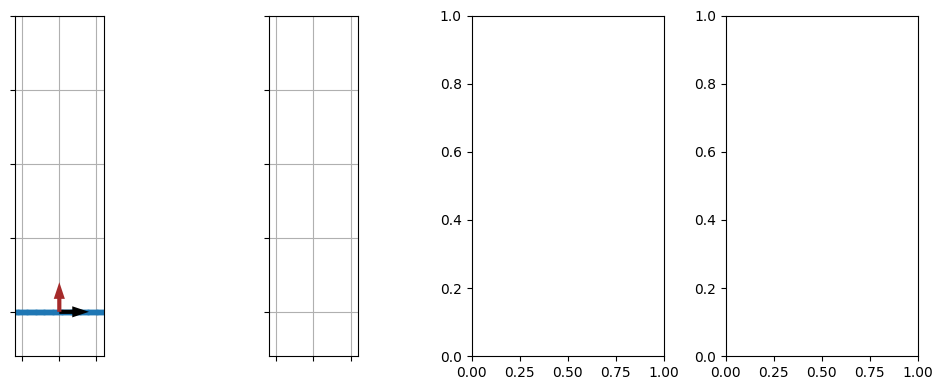

In [892]:
fig, ax = plt.subplots(1, 4, figsize=(10, 4))
data = t.linspace(-3, 3, 100)
data = t.stack((data, t.zeros_like(data))).T
print(data.mean(dim=0)[1])
u, s, v = t.svd(data)
plot_points(data, v*2, ylim=[-3, 20], ax=ax[0])
data[0, 0] = 1.
data[0, 1] = 19
print(data.mean(dim=0)[1])
u, s, v = t.svd(data)
v[:, 0] *= -1
plot_points(data, v*2, ylim=[-3, 20], ax=ax[1])
data = t.linspace(-3, 3, 1000)
data = t.stack((data, t.ones_like(data))).T
print(data.mean(dim=0)[1])
u, s, v = t.svd(data)
plot_points(data, v*2, ylim=[-3, 20], ax=ax[2])
data[0, 0] = 1.
data[0, 1] = 47
u, s, v = t.svd(data)
v[:, 0] *= -1
plot_points(data, v*2, ylim=[-3, 20], ax=ax[3])
data.mean(dim=0)[1]

## image compression

In [ ]:
img = transforms.ToTensor()(Image.open('data/img.png')).permute(1, 2, 0)

In [ ]:
def plot_img(img, title=None, ax=None, loc='left'):
    if ax is None: fig, ax = plt.subplots()
    else: fig = ax.get_figure()
    img = img.clip(0.0, 1.0)
    ax.axis('off')
    fig.tight_layout()
    if title is not None: ax.set_title(title, loc=loc)
    ax.imshow(img)

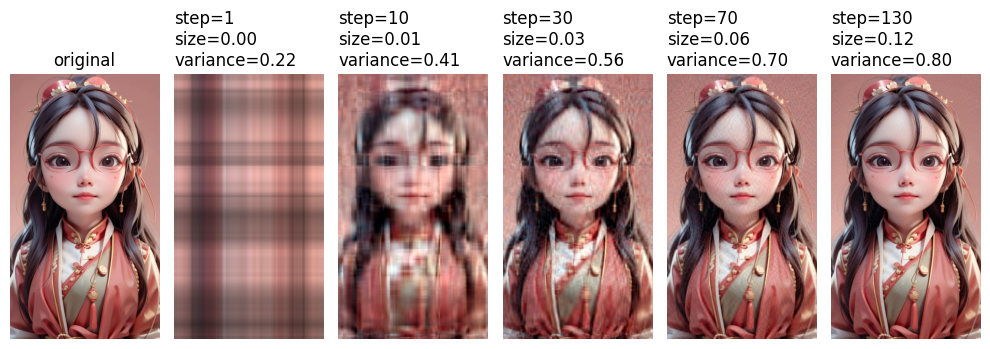

In [ ]:
def plot_compression_stages(img):
    h, w, c = img.shape
    original_size = h * w * c
    u, s, v = t.svd(img.reshape(h, w * c))

    steps = [1, 10, 30, 70, 130]
    fig, axs = plt.subplots(1, len(steps) + 1, figsize=(10, 4))
    plot_img(img, title='original', ax=axs[0], loc=None)
    for step, ax in zip(steps, axs.tolist()[1:]):
        reconstructed = u[:, :step] @ t.diag(s[:step]) @ v[:, :step].T
        reconstructed = reconstructed.view(h, w, c)
        current_size = step * (1 + h + w * c)
        size_ratio = current_size / original_size
        variance_ratio = s[:step].sum() / s.sum()
        title = f'{step=}\nsize={size_ratio:.2f}\nvariance={variance_ratio:.2f}'
        plot_img(reconstructed, title=title, ax=ax)

plot_compression_stages(img)

In [ ]:
def plot_compression_animation(img):
    h, w, c = img.shape
    fig, ax = plt.subplots(figsize=(w / 500, h / 500))
    reconstructed = [t.zeros((h, w * c))]
    u, s, v = t.svd(img.reshape(h, w * c))

    def update(i):
        if i == 0: reconstructed[0] *= 0.
        reconstructed[0] += s[i] * u[:, i:i+1] @ v[:, i:i+1].T
        ax.clear()
        plot_img(reconstructed[0].view(h, w, c), ax=ax)

    ani = FuncAnimation(fig, update, frames=range(100), interval=100)
    plt.close(fig)
    return ani

ani = plot_compression_animation(img)
display(HTML(ani.to_jshtml())) # display in notebook
ani.save('imgs/compression.gif', fps=20) # save to disk

MovieWriter ffmpeg unavailable; using Pillow instead.


## Recommender System

```
user_id, book_id, rating
lookup at https://www.goodreads.com/book/show/{book_id}
```

In [ ]:
# url = 'https://github.com/zygmuntz/goodbooks-10k/raw/master/ratings.csv'
# !wget -nc $url -P data

In [2]:
d_books = 10001
d_retain = 10
d_train = 5000
d_test = 1000

data = pd.read_csv('data/ratings.csv')
truncated_data = data.where(data['user_id'] < d_train).dropna()
ratings = t.tensor(truncated_data.values, dtype=t.bfloat16)
ratings.shape

torch.Size([582455, 3])

### SVD

In [ ]:
def to_matrix(ratings):
    users = ratings[:, 0].max().int() + 1
    user_book = t.zeros(users, d_books, dtype=t.float32)
    for user_id, book_id, rating in ratings:
        user_book[user_id.int(), book_id.int()] = rating
    return user_book

user_book = to_matrix(ratings)
print(f'ratings sparcity: {(user_book == 0.).sum() / user_book.numel()}')

ratings sparcity: 0.9942358136177063


In [ ]:
u, s, v = t.svd(user_book)

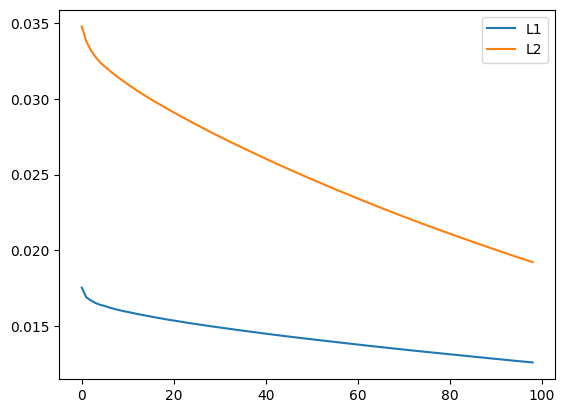

In [ ]:
def losses(u, s, v, r):
    reconstructed = u[:, :r] @ t.diag(s[:r]) @ v[:, :r].T
    l1 = (user_book - reconstructed).abs().mean()
    l2 = ((user_book - reconstructed)**2).mean()
    return l1, l2

def plot_losses(u, s, v, r=400):
    l1s, l2s = [], []
    for i in range(1, r):
        l1, l2 = losses(u, s, v, i)
        l1s.append(l1)
        l2s.append(l2)
    fig, ax = plt.subplots()
    ax.plot(l1s, label='L1')
    ax.plot(l2s, label='L2')
    ax.legend()

plot_losses(u, s, v, r=100)

In [ ]:
def to_validation_set(ds):
    predictors, labels = [], []
    for _, group in ds.groupby('user_id'):
        group.sort_values('rating', ascending=False, inplace=True)
        predictor = t.zeros(d_books, dtype=t.float32)
        for _, book_id, rating in t.tensor(group.values[:-d_retain]):
            predictor[book_id.int()] = rating
        predictors.append(predictor)
        labels.append(t.tensor(group['book_id'][-d_retain:].values))
    return t.stack(predictors), t.stack(labels)

predictors, labels = to_validation_set(data.where(data['user_id'] > d_train).where(data['user_id'] < d_train + d_test).dropna())

In [ ]:
def top_n_matches(recommendations, labels, n=10):
    top_n = recommendations[:, :n]
    matches = (top_n[:, :, None] == labels[:, None, :]).sum(dim=(1, 2)) # cross product
    matches = matches.float().mean()
    return matches / d_retain

def recommend(predictors, v, r=100):
    users_embedding = predictors @ v[:, :r]
    scores = users_embedding @ v[:, :r].T
    scores[predictors != 0] = 0 # remove already rated books
    return scores.argsort(descending=True)

svd_recommendations = recommend(predictors, v)
svd_top_ratio = top_n_matches(svd_recommendations, labels).item()
random_recommendations = recommend(predictors, t.rand_like(v))
random_top_ratio = top_n_matches(random_recommendations, labels).item()
popularity_recommendation = user_book.mean(dim=0).argsort(descending=True)[None, :]
popularity_top_ratio = top_n_matches(popularity_recommendation, labels).item()

print(f'{svd_top_ratio=:.4f} {random_top_ratio=:.4f} {popularity_top_ratio=:.4f}')

svd_top_ratio=0.0525 random_top_ratio=0.0009 popularity_top_ratio=0.0158


### SVD approximation (Funk-SVD)

In [ ]:
class ApproximateSVD(nn.Module):
    def __init__(self, users, books, r=100):
        super().__init__()
        self.u = nn.Linear(r, users, bias=False)
        self.vt = nn.Linear(books, r, bias=False)

    def forward(self):
        return self.u.weight @ self.vt.weight
    
def train(model, target, epochs=1000, lr=1e-3, opt=None):
    print(f'{target.shape=}')
    if opt is None: opt = optim.AdamW(model.parameters(), lr=lr, weight_decay=1e-1)
    for epoch in range(epochs):
        approximation = model()
        approximation[target == 0] = 0 # ignore unrated books
        loss = F.mse_loss(approximation, target)
        # mask = (target != 0).float()
        # loss = F.mse_loss(approximation * mask, target * mask)
        opt.zero_grad()
        loss.backward()
        opt.step()
        if epoch % 500 == 0: print(loss.item())

model = ApproximateSVD(4993, 10001, r=50).to(device)
target = user_book.to(device)
train(model, target, epochs=10000, lr=3e-4)

target.shape=torch.Size([4993, 10001])
0.08632897585630417
0.018760036677122116
0.004957607947289944
0.004899824503809214
0.004888745024800301
0.004875097423791885
0.004856238607317209
0.004827500320971012
0.004778196569532156
0.0046833897940814495
0.00449196994304657
0.004149566404521465
0.0037192439194768667
0.0033715537283569574
0.003159207059070468
0.003028480103239417
0.0029374908190220594
0.0028699177782982588
0.0028181648813188076
0.002777747344225645


In [ ]:
approx_svd_recommendations = recommend(predictors, model.vt.weight.T.to('cpu'))
approx_svd_top_ratio = top_n_matches(approx_svd_recommendations, labels).item()
approx_svd_top_ratio

0.00860860850661993

### funk SVD / line

In [ ]:
class FunkSVD(nn.Module):
    def __init__(self, users, books, r=100):
        super().__init__()
        self.user_factors = nn.Embedding(users, r)
        self.item_factors = nn.Embedding(books, r)

    def forward(self, user, item):
        return (self.user_factors(user) * self.item_factors(item)).sum(1)

def train_funk_svd(model, train_data, epochs=50, lr=0.01, reg_lambda=0.01):
    opt = optim.Adam(model.parameters(), lr=lr)    
    for epoch in range(epochs):
        total_loss = 0
        for user, item, rating in train_data:
            prediction = model(user, item)
            loss = (prediction - rating)**2
            
            # # Add regularization terms
            # reg_loss = reg_lambda * (t.sum(model.user_factors(user)**2) + 
            #                          t.sum(model.item_factors(item)**2))
            # total_loss = loss + reg_loss
            
            opt.zero_grad()
            loss.backward()
            opt.step()
        
        if epoch % 5 == 0:
            print(f"Epoch {epoch}, Loss: {total_loss.item()}")

model = FunkSVD(4993, 10001).to(device)
target = user_book.to(device)
train_funk_svd(model, target, reg_lambda=0.01)

### claude

In [ ]:
user_indices, book_indices = t.nonzero(target, as_tuple=True)

In [ ]:
user_indices, book_indices

(tensor([   1,    1,    1,  ..., 4992, 4992, 4992], device='cuda:0'),
 tensor([   4,   10,   11,  ..., 9792, 9920, 9984], device='cuda:0'))

In [ ]:
class FunkSVD(nn.Module):
    def __init__(self, users, books, r=100):
        super().__init__()
        self.user_factors = nn.Embedding(users, r)
        self.book_factors = nn.Embedding(books, r)

    def forward(self, user_indices, book_indices):
        user_factors = self.user_factors(user_indices)
        book_factors = self.book_factors(book_indices)        
        return t.sum(user_factors * book_factors, dim=1)

def train(model, target, epochs=1000, lr=1e-3, opt=None):
    if opt is None: opt = optim.AdamW(model.parameters(), lr=lr)
    for epoch in range(epochs):
        user_indices, book_indices = t.nonzero(target, as_tuple=True)
        
        predictions = model(user_indices, book_indices)
        actual_ratings = target[user_indices, book_indices]
        loss = F.mse_loss(predictions, actual_ratings)
        opt.zero_grad()
        loss.backward()
        opt.step()
        
        if epoch % 500 == 0:
            print(f"Epoch {epoch}, Loss: {loss.item():.4f}")

# Usage
model = FunkSVD(4993, 10001, r=20).to(device)
target = user_book.to(device)
train(model, target, epochs=10000, lr=3e-4)

Epoch 0, Loss: 34.8700
Epoch 500, Loss: 27.0661
Epoch 1000, Loss: 21.1302
Epoch 1500, Loss: 14.1219
Epoch 2000, Loss: 8.6184
Epoch 2500, Loss: 5.6519
Epoch 3000, Loss: 3.9985
Epoch 3500, Loss: 2.9601
Epoch 4000, Loss: 2.2595
Epoch 4500, Loss: 1.7724
Epoch 5000, Loss: 1.4322
Epoch 5500, Loss: 1.1977
Epoch 6000, Loss: 1.0404
Epoch 6500, Loss: 0.9383
Epoch 7000, Loss: 0.8746
Epoch 7500, Loss: 0.8360
Epoch 8000, Loss: 0.8126
Epoch 8500, Loss: 0.7977
Epoch 9000, Loss: 0.7869
Epoch 9500, Loss: 0.7778


In [ ]:
approx_svd_recommendations = recommend(predictors, model.book_factors.weight.to('cpu'))
approx_svd_top_ratio = top_n_matches(approx_svd_recommendations, labels).item()
approx_svd_top_ratio

0.0009009009227156639

In [ ]:
def rec(predictors, model):
    # new_user_ratings = predictors[0]
    new_user_ratings = predictors
    rated_books = t.nonzero(new_user_ratings).squeeze()
    rated_book_factors = model.book_factors.weight[rated_books]
    ratings = new_user_ratings[rated_books]
    user_factors = t.linalg.lstsq(rated_book_factors.cpu(), ratings.cpu()).solution
    predictions = t.mm(user_factors.unsqueeze(0).cpu(), model.book_factors.weight.t().cpu()).squeeze()
    sorted_indices = t.argsort(predictions, descending=True)
    return sorted_indices


funk_svd_recommendations = t.stack([rec(p, model) for p in predictors])
funk_svd_top_ratio = top_n_matches(funk_svd_recommendations, labels).item()
funk_svd_top_ratio

0.0005005004932172596

In [ ]:
def top_n_matches(recommendations, labels, n=10):
    top_n = recommendations[:, :n]
    matches = (top_n[:, :, None] == labels[:, None, :]).sum(dim=(1, 2)) # cross product
    matches = matches.float().mean()
    return matches / d_retain

def recommend(predictors, v, r=100):
    users_embedding = predictors @ v[:, :r]
    scores = users_embedding @ v[:, :r].T
    scores[predictors != 0] = 0 # remove already rated books
    return scores.argsort(descending=True)

svd_recommendations = recommend(predictors, v)
svd_top_ratio = top_n_matches(svd_recommendations, labels).item()

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim

class FunkSVD(nn.Module):
    def __init__(self, num_users, num_items, num_factors=100):
        super(FunkSVD, self).__init__()
        self.user_factors = nn.Parameter(torch.randn(num_users, num_factors))
        self.item_factors = nn.Parameter(torch.randn(num_items, num_factors))

    def forward(self, user_indices, item_indices):
        # Extract the relevant user and item factors by indexing
        user_vecs = self.user_factors[user_indices]
        item_vecs = self.item_factors[item_indices]
        # Compute the dot product between user and item vectors to get the predicted ratings
        ratings_pred = torch.sum(user_vecs * item_vecs, dim=1)
        return ratings_pred

def train(model, target, epochs=1000, lr=1e-3):
    model.train()
    optimizer = optim.Adam(model.parameters(), lr=lr)
    criterion = nn.MSELoss()  # Mean Squared Error Loss

    # users, items, ratings = data  # unpacking the dataset
    users, items = t.nonzero(target, as_tuple=True)
    ratings = target[users, items]
    for epoch in range(epochs):
        optimizer.zero_grad()
        
        # Forward pass: Compute predicted ratings
        predictions = model(users, items)
        
        # Compute and print loss
        loss = criterion(predictions, ratings)
        
        # Backpropagation
        loss.backward()
        optimizer.step()
        
        if epoch % 500 == 0:
            print(f"Epoch {epoch}: Loss = {loss.item()}")

model = FunkSVD(4993, 10001).to(device)
target = user_book.to(device)
train(model, target, epochs=10000, lr=3e-4)

Epoch 0: Loss = 116.0870361328125
Epoch 500: Loss = 74.64908599853516
Epoch 1000: Loss = 48.87652587890625
Epoch 1500: Loss = 30.434825897216797
Epoch 2000: Loss = 19.332660675048828
Epoch 2500: Loss = 12.486886024475098


KeyboardInterrupt: 

In [ ]:
approx_svd_recommendations = recommend(predictors, model.item_factors.data.to('cpu'))
approx_svd_top_ratio = top_n_matches(approx_svd_recommendations, labels).item()
approx_svd_top_ratio

0.0019019019091501832

### naive funk

In [ ]:
class NaiveFunk(nn.Module):
    def __init__(self, users, books, r=100):
        super().__init__()
        self.user_factors = nn.Parameter(torch.randn(users, r))
        self.book_factors = nn.Parameter(torch.randn(books, r))

    def forward(self, user, book):
        user_vec = self.user_factors[user]
        book_vec = self.book_factors[book]
        ratings = t.sum(user_vec * book_vec, dim=-1)
        return ratings

def train(model, target, epochs=1000, lr=1e-3, opt=None):
    if opt is None: opt = optim.AdamW(model.parameters(), lr=lr, weight_decay=1e-1)
    for epoch in range(epochs):
        user_idx, book_idx = t.nonzero(target, as_tuple=True)
        preds = model(user_idx, book_idx)
        ratings = target[user_idx, book_idx]
        loss = F.mse_loss(preds, ratings)
        # punish scores above 5 or below 1
        reconstructed = model.user_factors.data @ model.book_factors.data.T
        unrated = reconstructed[target == 0]
        loss += 1. * F.mse_loss(unrated, unrated.clamp(1, 5))

        opt.zero_grad()
        loss.backward()
        opt.step()
        if epoch % 500 == 0:
            # print(f'loss {loss.item():.4f}')
            recs = recommend(predictors, model.book_factors.data.to('cpu'))
            top_ratio = top_n_matches(recs, labels)
            print(f'{epoch=} loss={loss.item():.4f} top={top_ratio.item():.4f}')

model = NaiveFunk(4993, 10001, r=100).to(device)
target = user_book.to(device)
train(model, target, epochs=100000, lr=1e-3)

In [ ]:
approx_svd_recommendations = recommend(predictors, model.book_factors.data.to('cpu'))
approx_svd_top_ratio = top_n_matches(approx_svd_recommendations, labels).item()
approx_svd_top_ratio

0.0051051052287220955

### Funk SVD over panda

In [12]:
class NaiveFunk(nn.Module):
    def __init__(self, users, books, r=100):
        super().__init__()
        self.user_factors = nn.Parameter(t.randn(users, r))
        self.book_factors = nn.Parameter(t.randn(books, r))

    def forward(self, user, book):
        user_vec = self.user_factors[user]
        book_vec = self.book_factors[book]
        ratings = t.sum(user_vec * book_vec, dim=-1)
        return ratings

def train(model, ds, epochs=1000, lr=1e-3, opt=None, batch_size=10000):
    if opt is None: opt = optim.AdamW(model.parameters(), lr=lr, weight_decay=1e-1)
    for epoch in range(epochs):
        for mini_epoch, batch_start in enumerate(range(0, len(ds), batch_size)):
            batch = ds[batch_start:batch_start+batch_size]
            user_idx = t.tensor(batch['user_id'].values, dtype=t.int, device=device)
            book_idx = t.tensor(batch['book_id'].values, dtype=t.int, device=device)
            ratings = t.tensor(batch['rating'].values, dtype=t.float32, device=device)
            preds = model(user_idx, book_idx)
            loss = F.mse_loss(preds, ratings)
            opt.zero_grad()
            loss.backward()
            opt.step()
        if epoch % 500 == 0:
            print(f'{epoch=} loss={loss.item():.4f}')

ds = data.iloc[:400000]
model = NaiveFunk(ds['user_id'].max() + 1, ds['book_id'].max() + 1, r=100).to(device)
train(model, ds, epochs=10000, lr=1e-3)

epoch=0 loss=111.1895
epoch=500 loss=0.0128
epoch=1000 loss=0.0124
epoch=1500 loss=0.0115
epoch=2000 loss=0.0237
epoch=2500 loss=0.0206
epoch=3000 loss=0.0130
epoch=3500 loss=0.0138
epoch=4000 loss=0.0191
epoch=4500 loss=0.0209
epoch=5000 loss=0.0175
epoch=5500 loss=0.0114
epoch=6000 loss=0.0118
epoch=6500 loss=0.0217
epoch=7000 loss=0.0187
epoch=7500 loss=0.0118
epoch=8000 loss=0.0271
epoch=8500 loss=0.0170
epoch=9000 loss=0.0146
epoch=9500 loss=0.0211


### validation

In [67]:
def get_big_users(ds, threshold=100):
    sorted_groups = ds.groupby('user_id').size().sort_values(ascending=False)
    groups = []
    for user_id in sorted_groups.index:
        group = ds_test[ds_test['user_id'] == user_id]
        if len(group) >= threshold:
            groups.append(group)
    return groups

ds_test = data.iloc[450000:500000].dropna()
test_users = get_big_users(ds_test)

In [69]:
def split_user(group, n=10):
    ordered = group.sort_values('rating', ascending=False)
    retain = ordered.iloc[:n]
    predictor = ordered.iloc[n:]
    return retain, predictor

@t.no_grad()
def predict_new_user(model, books, ratings, top_n=10):
    rated_book_factors = model.book_factors[books]
    user_factors = t.linalg.lstsq(rated_book_factors, ratings).solution
    predictions = user_factors @ model.book_factors.data.T
    return predictions

@t.no_grad()
def recommend_new_user(predictions, books):
    preds = predictions.clone()
    preds[books] = -1e9
    return preds.argsort(descending=True)

@t.no_grad()
def score_new_user(model, retain, predictor, top_n=10):
    books = t.tensor(predictor['book_id'].values, dtype=t.int, device=device)
    ratings = t.tensor(predictor['rating'].values, dtype=t.float32, device=device)
    predictions = predict_new_user(model, books, ratings)
    tops = recommend_new_user(predictions, books)[:top_n]
    matches = (tops[:, None] == retain[None, :]).sum()
    return matches / len(retain)

all_matches = []
for user_ds in test_users:
    retain, predictor = split_user(user_ds)
    retain = t.tensor(retain['book_id'].values, dtype=t.int, device=device)
    matches = score_new_user(model, retain, predictor)
    all_matches.append(matches)
t.stack(all_matches).mean()

tensor(0.0135, device='cuda:0')